<a href="https://colab.research.google.com/github/CHINTHALABOINANAGENDRA/CAR-AND-PEDESTRAIN-TRACKER-USING-MACHINE-LEARNING/blob/main/CAR%20AND%20PEDESTRIAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

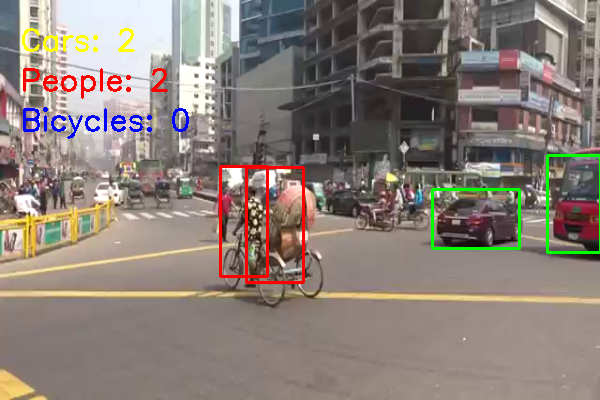

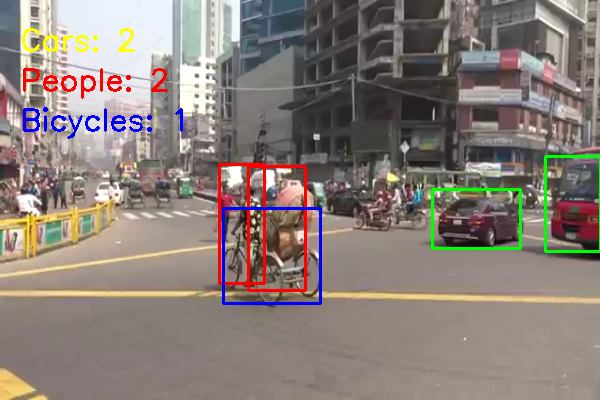

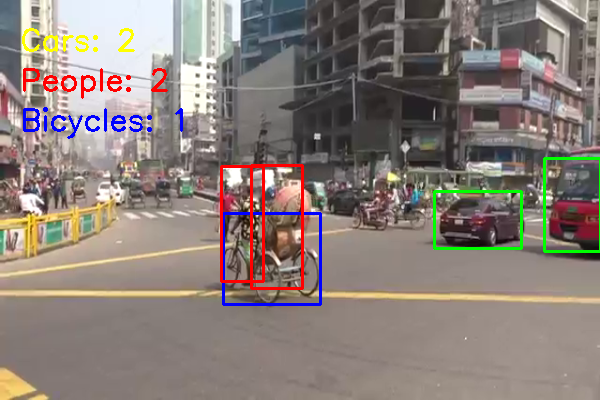

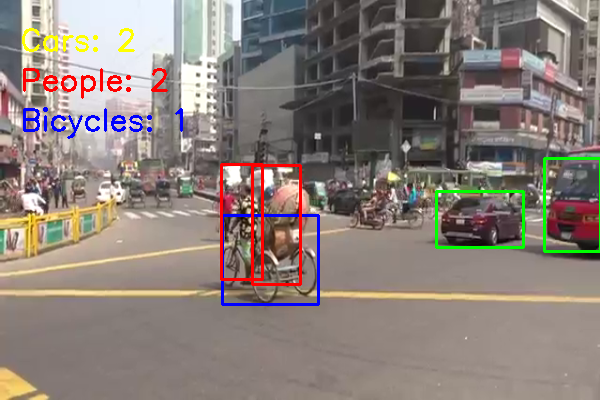

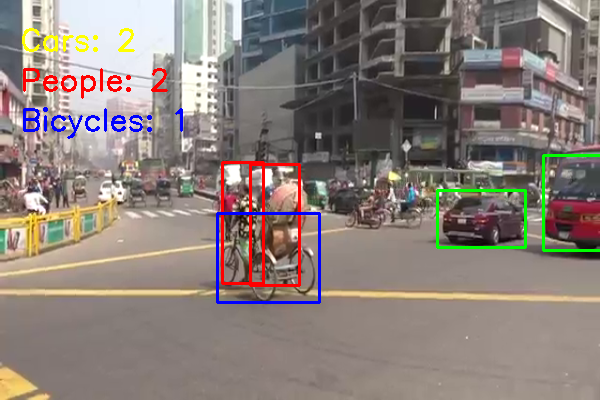

...

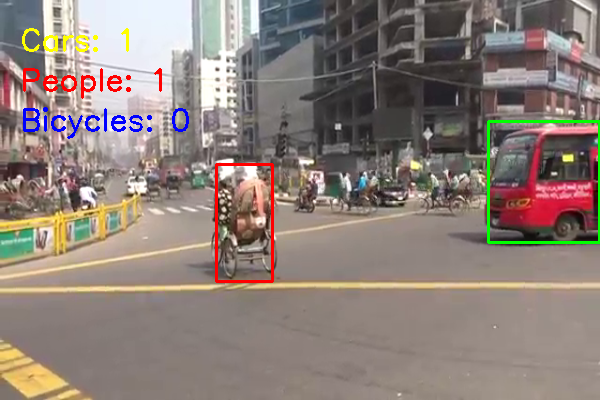

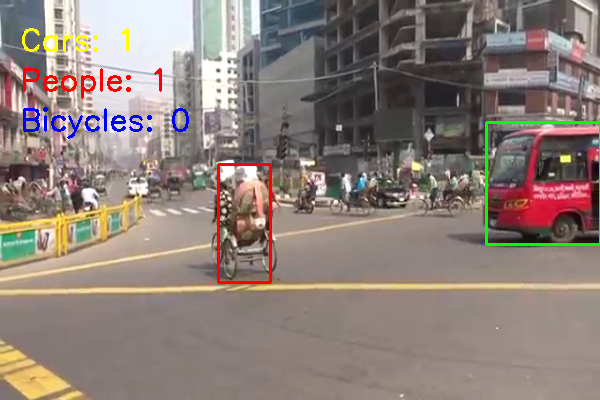

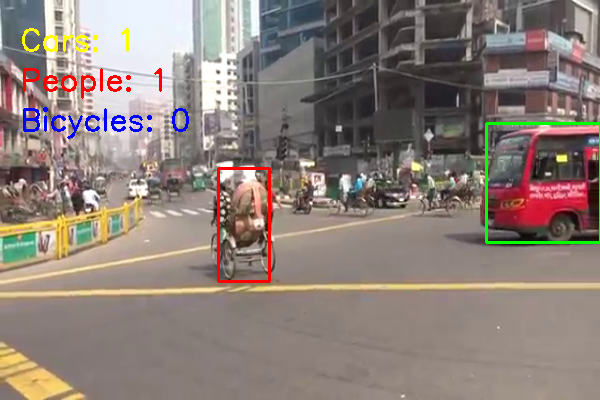

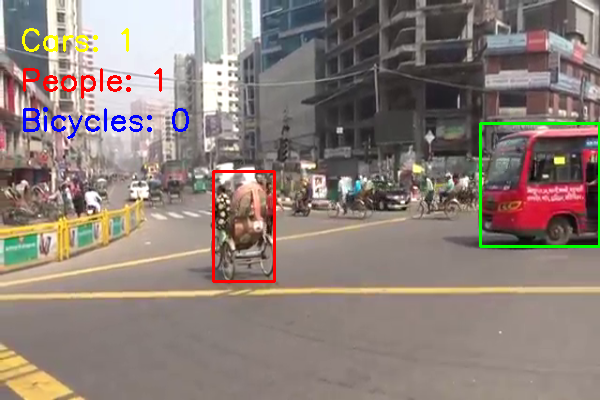

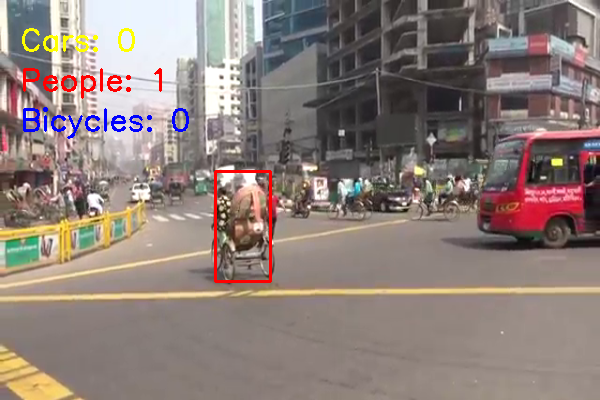

In [ ]:
import cv2
import numpy as np
import zipfile
import os
import tempfile
import urllib.request
from google.colab.patches import cv2_imshow  # For displaying images in Colab

# Function to download model files
def download_file(url, save_path):
    print(f"Downloading {url} to {save_path}...")
    urllib.request.urlretrieve(url, save_path)
    print(f"Download complete: {save_path}")

# Function to extract ZIP file contents
def extract_zip(zip_path):
    temp_dir = tempfile.mkdtemp()
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(temp_dir)
    return temp_dir

# Download and load the MobileNet model
def download_mobilenet_model():
    prototxt_url = "https://raw.githubusercontent.com/chuanqi305/MobileNet-SSD/master/deploy.prototxt"
    model_url = "https://github.com/chuanqi305/MobileNet-SSD/raw/master/mobilenet_iter_73000.caffemodel"

    prototxt_path = 'deploy.prototxt'
    caffe_model_path = 'mobilenet_iter_73000.caffemodel'

    if not os.path.exists(prototxt_path):
        download_file(prototxt_url, prototxt_path)

    if not os.path.exists(caffe_model_path):
        download_file(model_url, caffe_model_path)

    return prototxt_path, caffe_model_path

# Load the MobileNet SSD model
prototxt_path, caffe_model_path = download_mobilenet_model()
net = cv2.dnn.readNetFromCaffe(prototxt_path, caffe_model_path)

# Class labels from MobileNet SSD
CLASSES = ["background", "airplane", "bicycle", "bird", "boat", "bottle", "bus", "car", "cat", "chair", "cow", "dog",
           "horse", "motorbike", "person", "plant", "sheep", "train", "tvmonitor"]

# Path to ZIP file
zip_file_path = '/content/dhaka_traffic.zip'  # Make sure this file exists

# Ensure the ZIP file exists
if not os.path.exists(zip_file_path):
    raise FileNotFoundError(f"{zip_file_path} not found. Please upload it to your Colab environment.")

# Extract ZIP file
extracted_dir = extract_zip(zip_file_path)

# Loop through all video files in the extracted folder
for video_file in os.listdir(extracted_dir):
    video_path = os.path.join(extracted_dir, video_file)

    if not video_file.lower().endswith(('.mp4', '.avi', '.mov')):
        continue  # Skip non-video files

    cap = cv2.VideoCapture(video_path)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        resized_frame = cv2.resize(frame, (600, 400))
        blob = cv2.dnn.blobFromImage(resized_frame, 0.007843, (300, 300), 127.5, swapRB=True)
        net.setInput(blob)
        detections = net.forward()

        # Initialize counters
        traffic_count = 0
        pedestrian_count = 0
        bicycle_count = 0

        for i in range(detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            if confidence > 0.2:
                class_id = int(detections[0, 0, i, 1])
                if class_id in [7, 15, 2]:  # Car, person, bicycle
                    box = detections[0, 0, i, 3:7] * np.array([600, 400, 600, 400])
                    (startX, startY, endX, endY) = box.astype("int")

                    color = (0, 255, 0) if class_id == 7 else (0, 0, 255) if class_id == 15 else (255, 0, 0)
                    cv2.rectangle(resized_frame, (startX, startY), (endX, endY), color, 2)

                    if class_id == 7:
                        traffic_count += 1
                    elif class_id == 15:
                        pedestrian_count += 1
                    elif class_id == 2:
                        bicycle_count += 1

        # Display detection counts
        cv2.putText(resized_frame, f"Cars: {traffic_count}", (20, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)
        cv2.putText(resized_frame, f"People: {pedestrian_count}", (20, 90), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
        cv2.putText(resized_frame, f"Bicycles: {bicycle_count}", (20, 130), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)

        cv2_imshow(resized_frame)

    cap.release()

cv2.destroyAllWindows()